# Course Project - Pneumonia Detection


---


> Image Processing and Analysis  
> MSc in Data Science and Information Technologies

>> **Team Members**       
>> George Filis - ds2200011  
>> George Rouvalis - ds2200006



# Notes
Due to the big ammount of the data needed to train the models ("chest_xray") it was not possible to include them in the uploaded ZIP file. In order to rerun the Jupyter notebok, a folder named "Data" should be created, which folder should contain the folder "chest_xray" which has the data as they were downloaded from kaggle. Also, the results from the models and from some specific preprocessing steps are already provided, along with certain images, which could also be presented if the Jupyter notebook is executed.

# Libraries


---


In [1]:
import os
import cv2
import sklearn
import numbers
import numpy as np
import pandas as pd
from time import time
import seaborn as sns
from PIL import Image
import tensorflow as tf
from sklearn.svm import SVC
from tensorflow import keras
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from tensorflow.keras.callbacks import ReduceLROnPlateau
from sklearn.decomposition import IncrementalPCA as IPCA
from sklearn.metrics import classification_report,confusion_matrix
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.layers import Dense, Conv2D , MaxPool2D , Flatten , Dropout , BatchNormalization, ZeroPadding2D
import warnings
warnings.filterwarnings("ignore")

# 1. Introduction: Data Exploration and Classes definition.



---




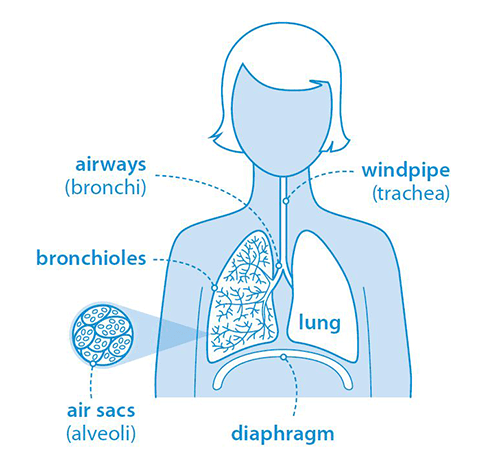

## **What is pneumonia?**

Pneumonia is an inflammatory condition of the lung primarily affecting the small air sacs known as alveoli.  Symptoms typically include some combination of productive or dry cough, chest pain, fever and difficulty breathing. The severity of the condition is variable.   

## **Types**

Pneumonia is usually caused by infection with viruses or bacteria, and less commonly by other microorganisms. Identifying the responsible pathogen can be difficult. 
<br><br>
**Bacterial Pneumonia**

Bacteria cause most cases of community-acquired pneumonia in adults.
One can catch pneumonia when someone who is infected coughs or sneezes. Bacteria-filled droplets get into the air, where they breathe them via the nose or mouth.
<br><br>
**Viral Pneumonia**

Viruses are the second most common cause of pneumonia. Many kinds cause the disease, including some of the same viruses that bring on colds and flu and the coronavirus that causes COVID-19.
<br><br>
**Fungal Pneumonia**

Fungi are a less common cause of pneumonia. It is not likely to get fungal pneumonia if the person is healthy. 

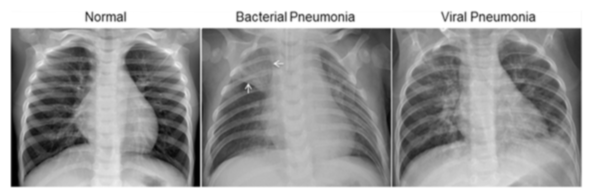

## **Diagnosis**

Diagnosis is often based on symptoms and physical examination. An important test for making a diagnosis of pneumonia is a chest x-ray. Chest x-rays can reveal areas of opacity (seen as white) which represent consolidation. Pneumonia is not always seen on x-rays, either because the disease is only in its initial stages, or because it involves a part of the lung not easily seen by x-ray.

# Exploratory Data Analysis


---

The dataset is organized into 3 folders (train, test, val) and contains subfolders for each image category (Pneumonia/Normal). There are 5,863 X-Ray images (JPEG) and 2 categories (Pneumonia/Normal).

Chest X-ray images (anterior-posterior) were selected from retrospective cohorts of pediatric patients of one to five years old from Guangzhou Women and Children’s Medical Center, Guangzhou. All chest X-ray imaging was performed as part of patients’ routine clinical care.

For the analysis of chest x-ray images, all chest radiographs were initially screened for quality control by removing all low quality or unreadable scans. The diagnoses for the images were then graded by two expert physicians before being cleared for training the AI system. In order to account for any grading errors, the evaluation set was also checked by a third expert.


## Dataset Load

In [2]:
labels = ['PNEUMONIA', 'NORMAL']
img_size = 150

def get_data(data_dir):
    data = [] 
    for label in labels: 
        path = os.path.join(data_dir, label)
        class_num = labels.index(label)
        for img in os.listdir(path):
            try:
                img_arr = cv2.imread(os.path.join(path, img), cv2.IMREAD_GRAYSCALE)
                resized_arr = cv2.resize(img_arr, (img_size, img_size)) # Reshaping images to preferred size
                data.append([resized_arr, class_num])
            except Exception as e:
                print(e)
    return np.array(data, dtype='object')

In [3]:
train = get_data('Data/chest_xray/train')
test = get_data('Data/chest_xray/test')
val = get_data('Data/chest_xray/val')

In [4]:
print("〰"*20)
print(f"Training Set has: {len(train)} images")
print(f"Testing Set has: {len(test)} images")
print(f"Validation Set has: {len(val)} images")
print("〰"*20)

〰〰〰〰〰〰〰〰〰〰〰〰〰〰〰〰〰〰〰〰
Training Set has: 5216 images
Testing Set has: 624 images
Validation Set has: 16 images
〰〰〰〰〰〰〰〰〰〰〰〰〰〰〰〰〰〰〰〰


## Classes - Data Balance

Train Set:


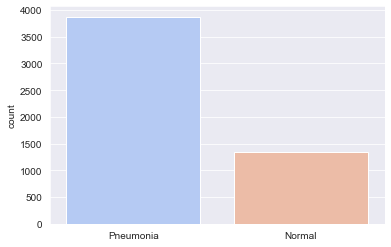

In [5]:
l = []
for i in train:
    if(i[1] == 0):
        l.append("Pneumonia")
    else:
        l.append("Normal")
sns.set_style('darkgrid')
sns.countplot(l, palette="coolwarm") 

print("Train Set:")

Data is imbalanced since Pneumonia images are at least twice as much as the normal ones. Consequently, the possibility of False Positive results is increased, thus, it must be resolved via Data Augmentation in which the training images will be enriched with variations of them. 

Test Set:


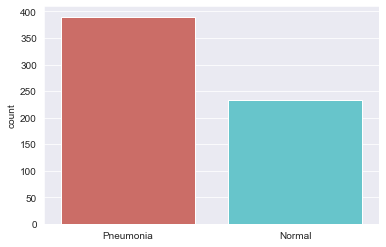

In [6]:
l = []
for i in test:
    if(i[1] == 0):
        l.append("Pneumonia")
    else:
        l.append("Normal")
sns.set_style('darkgrid')
sns.countplot(l, palette="hls") 

print("Test Set:")

Validation Set:


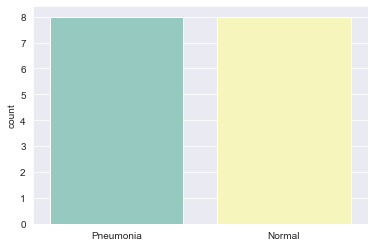

In [7]:
l = []
for i in val:
    if(i[1] == 0):
        l.append("Pneumonia")
    else:
        l.append("Normal")
sns.set_style('darkgrid')
sns.countplot(l, palette="Set3") 

print("Validation Set:")

In [8]:
x_train, y_train = [], []
for feature, label in train:
    x_train.append(feature)
    y_train.append(label)

x_test, y_test = [], []
for feature, label in test:
    x_test.append(feature)
    y_test.append(label)

x_val, y_val = [], []
for feature, label in val:
    x_val.append(feature)
    y_val.append(label)

## Images Overview

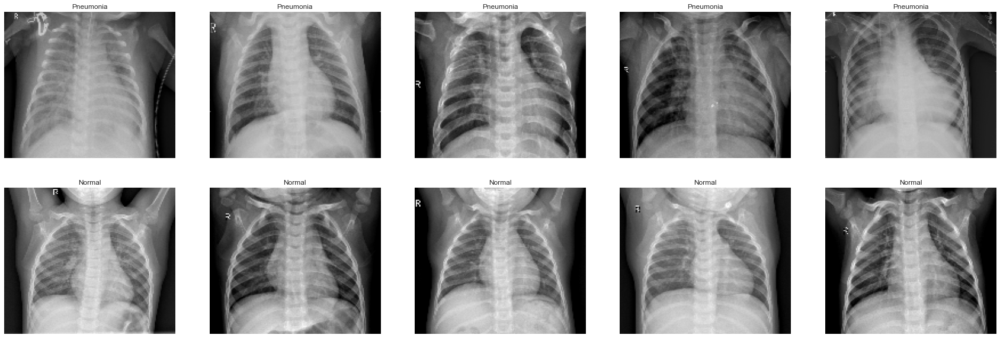

In [9]:
pneumonia_samples, normal_samples = [], []
for i in range(0, len(x_train)):
    if (y_train[i] == 0 and (len(pneumonia_samples) < 5)):
        pneumonia_samples.append(x_train[i])
        
    if (y_train[i] == 1 and (len(normal_samples) <= 5)):
        normal_samples.append(x_train[i])
    
    if(len(pneumonia_samples) + len(normal_samples) == 10):
        break
    
    
# # Concat the data in a single list and del the above two list
samples = pneumonia_samples + normal_samples

# Plot the data 
f, ax = plt.subplots(2,5, figsize=(30,10))
for i in range(10):
    img = samples[i]
    ax[i//5, i%5].imshow(img, cmap='gray')
    if i<5:
        ax[i//5, i%5].set_title("Pneumonia")
    else:
        ax[i//5, i%5].set_title("Normal")
    ax[i//5, i%5].axis('off')
    ax[i//5, i%5].set_aspect('auto')
plt.show()

## Gaussian Blur Overview
This type of filtering makes more evident the differences between bright and dark areas of the images. This allows for a "cleaner" look in details of the shapes in the image and could potentially be helpful in determining images of people with pneumonia.

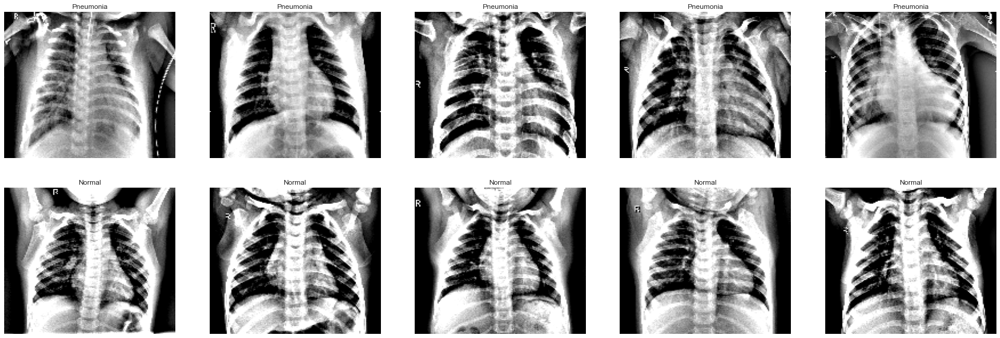

In [10]:
# Plot the data 
f, ax = plt.subplots(2,5, figsize=(30,10))
for i in range(10):
    img = samples[i]
    img = cv2.addWeighted (img, 4, cv2.GaussianBlur(img, (0,0), 150/10), -4, 128)
    ax[i//5, i%5].imshow(img, cmap='gray')
    if i<5:
        ax[i//5, i%5].set_title("Pneumonia")
    else:
        ax[i//5, i%5].set_title("Normal")
    ax[i//5, i%5].axis('off')
    ax[i//5, i%5].set_aspect('auto')
plt.show()

## Pixel Distribution Overview (Fourrier)
The brighter the center of the images is the more are the frequencies of the images. Based on the images below we could suggest that images of people with pneumonia may present a lower number of frequencies which could be explained by the fact that images with pneumonia are more "blurred" that normal ones.

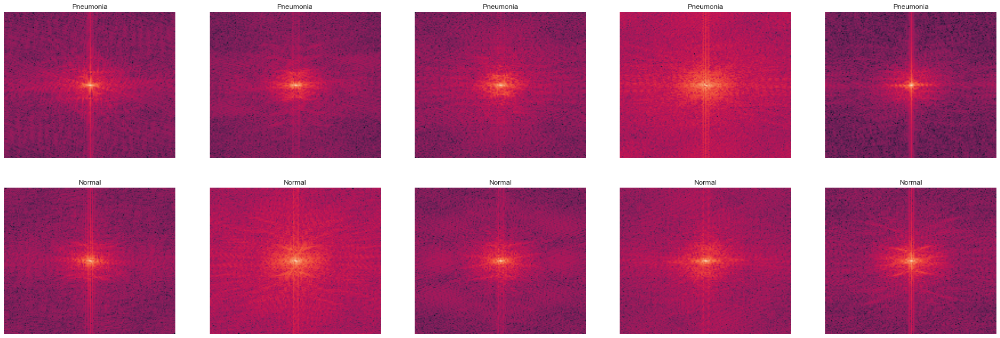

In [11]:
f, ax = plt.subplots(2,5, figsize=(30,10))
for i in range(10):
    img = samples[i]
    f = np.fft.fft2(img)
    fshift = np.fft.fftshift(f)
    magnitude_spectrum = 20*np.log(np.abs(fshift))
    
    ax[i//5, i%5].imshow(magnitude_spectrum)
    if i<5:
        ax[i//5, i%5].set_title("Pneumonia")
    else:
        ax[i//5, i%5].set_title("Normal")
    ax[i//5, i%5].axis('off')
    ax[i//5, i%5].set_aspect('auto')
plt.show()

## Edges Overview

Edge detection in this inspection is crucial as in Pneumonia x-rays the rib bones and lung is pale white and the edges are barely visible. On the contrary, in the case of normal X-rays the bones are clearly visible which is captured below.

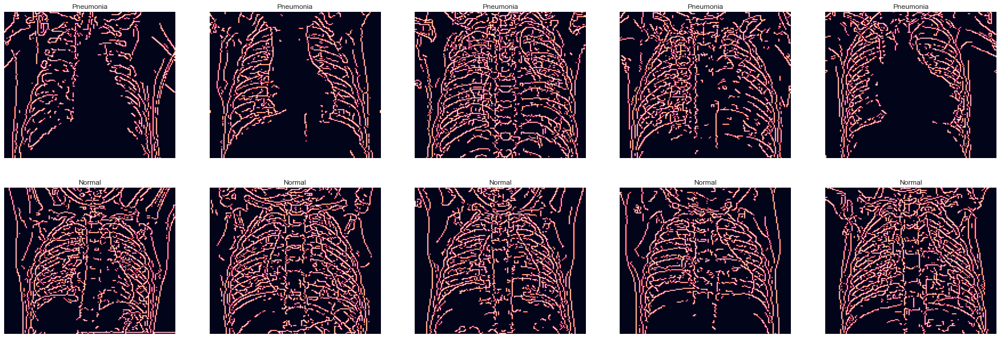

In [12]:
# Plot the data 
f, ax = plt.subplots(2,5, figsize=(30,10))
for i in range(10):
    img = samples[i]
    edges = cv2.Canny(img, 80, 100)
    ax[i//5, i%5].imshow(edges)
    if i<5:
        ax[i//5, i%5].set_title("Pneumonia")
    else:
        ax[i//5, i%5].set_title("Normal")
    ax[i//5, i%5].axis('off')
    ax[i//5, i%5].set_aspect('auto')
plt.show()

## Dilation Overview
Based on the dilated images below, we could note that images of people without pneumonia seem to have brighter "rectangles" than of those of people with pneumonia.

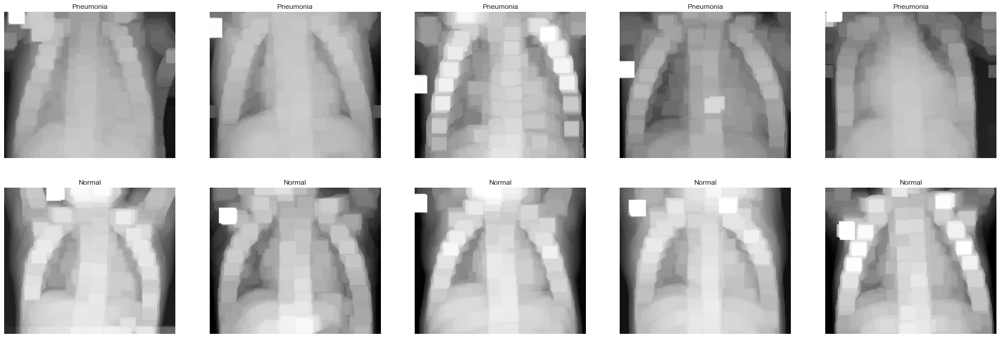

In [13]:
# Plot the data 
f, ax = plt.subplots(2,5, figsize=(30,10))
for i in range(10):
    img = samples[i]
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    kernel = np.ones((5, 5), np.uint8)
    img_erosion = cv2.dilate(img, kernel, iterations=3)
    ax[i//5, i%5].imshow(img_erosion)
    if i<5:
        ax[i//5, i%5].set_title("Pneumonia")
    else:
        ax[i//5, i%5].set_title("Normal")
    ax[i//5, i%5].axis('off')
    ax[i//5, i%5].set_aspect('auto')
plt.show()

## Background Subtraction Overview
Based on the modified images below we can see that images of people with pneumonia have much less frequencies than of the people who are normal.

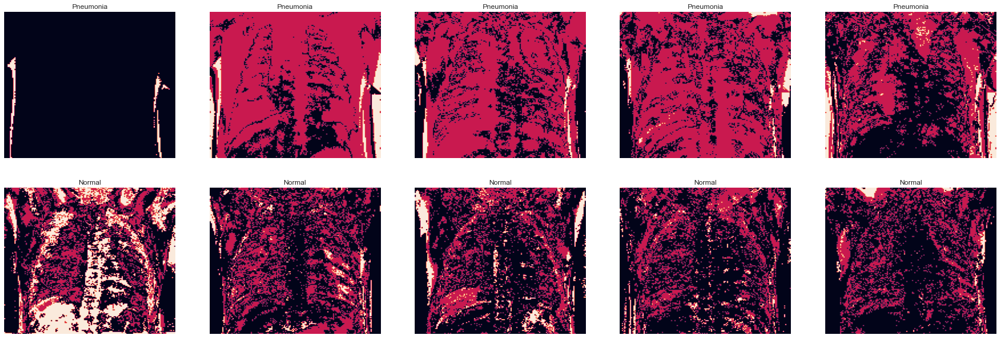

In [14]:
fgbg = cv2.createBackgroundSubtractorMOG2()

# Plot the data 
f, ax = plt.subplots(2,5, figsize=(30,10))
for i in range(10):
    img = samples[i]
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
   
    img = fgbg.apply(img)

    ax[i//5, i%5].imshow(img)
    if i<5:
        ax[i//5, i%5].set_title("Pneumonia")
    else:
        ax[i//5, i%5].set_title("Normal")
    ax[i//5, i%5].axis('off')
    ax[i//5, i%5].set_aspect('auto')
plt.show()

# 2-3. Preprocessing and Models

____


After checking different modification processes for the images and after visualizing the corresponding results, we decided that it would be best to use the most appropriate preprocessing methods for each of the two models that were implemented (the classical machine learning approach and the neural network). Therefore, we have separated the preprocessing steps and we present them for each of the models accordingly. In a similar way, we present separately the construction and the results of each model and finally, in the conclusions, we compare the results of both models and we draw our conclusions. At first, the classical machine learning approach utilized is presented alongside the corresponding preprocessing of the data, the process of creating the model and its results and then the second approach of the neural network is presented, again alongside the same type of information as for the prevous model.  

# 2. Classical machine learning approach: Support Vector Machine (SVM)

---


SVM is a supervised machine learning technique which in general can be used in order to solve regression and classification problems, but it is more frequently used for the latter one. SVM is based on estimating the best possible hyperplane which can divide the points of the different groups in the data. The data may exist on multiple dimensions and the hyperplane is determined based on specific criteria which lead to the "best" possible seperation of the groups in the data, thus to achieve the proper classification of new data points. Also, the hyperplane can be set of specific nature (e.g. linear, polynomial).

### Functions - Implementation
At first, all functions used in the pipeline of implementing the SVM technique, are being set in the beginning and then these functions are being called in the proper order in order for the whole analysis to be executed and the SVM to perform the classification of the test set images.

### Function: Diplsaying Images
The function takes as input one np.array, the header of the image, whether or not the image will be printed on the Grayscale channel, the length and width of the figure.

In [1]:
def display_image(image, image_header, gray, length, width):
    plt.figure(figsize=(length, width))
    if gray:
        plt.imshow(image, cmap='gray')
    else:
        plt.imshow(image)
    plt.title(image_header)
    plt.axis('off')
    plt.xticks([])
    plt.yticks([])
    plt.show()

### Collecting Paths
The function takes as input the names of images and the folder which contains them and returns a list with all the paths of the images in order to be used for the preprocessing analysis. 

In [2]:
def dataset_paths(images_names, folder_name):
    paths = []
    for i in images_names:
        image_path = folder_name + i
        paths.append(image_path)
    return paths

## 2.1 Preprocessing
___
### Function: Collecting images
Based on the names of the folders which contain the images (folders with the training, validation and test set images) and the lists with their names, by implementing the function above, the paths of the images are collected and divided in different lists based on the training, validation and test sets and at each case based on the normal and pneumonia sets.
Also, for an initial visualization of the images, two normal and two pneumonia images are printed on the screen, for the training and test sets. It should be mentioned by this point, that visualization was done only for the training and test sets and not for the validation set. This is based on the fact that later on, the training of the classifier includes the validation processing on its own implementation, meaning that the validation set is being generated on the fly by the program used for the creation of the classifier. Therefore, no validation set is needed prior to the training of the classifier and it is merged with the training set at a following step of the analysis.

In [3]:
def collect_images():
    train_normal_folder = "Data\\chest_xray\\train\\NORMAL\\"
    train_pneumonia_folder = "Data\\chest_xray\\train\\PNEUMONIA\\"
    val_normal_folder = "Data\\chest_xray\\val\\NORMAL\\"
    val_pneumonia_folder = "Data\\chest_xray\\val\\PNEUMONIA\\"
    test_normal_folder = "Data\\chest_xray\\test\\NORMAL\\"
    test_pneumonia_folder = "Data\\chest_xray\\test\\PNEUMONIA\\"

    train_normal_images_names = os.listdir(train_normal_folder)
    train_pneumonia_images_names = os.listdir(train_pneumonia_folder)
    val_normal_images_names = os.listdir(val_normal_folder)
    val_pneumonia_images_names = os.listdir(val_pneumonia_folder)
    test_normal_images_names = os.listdir(test_normal_folder)
    test_pneumonia_images_names = os.listdir(test_pneumonia_folder)

    train_normal_images_paths = []

    train_normal_images_paths = dataset_paths(train_normal_images_names, train_normal_folder)
    train_pneumonia_images_paths = dataset_paths(train_pneumonia_images_names, train_pneumonia_folder)
    train_images_paths = train_normal_images_paths + train_pneumonia_images_paths
    train_normal_labels = np.zeros(len(train_normal_images_paths))
    train_pneumonia_labels = np.ones(len(train_pneumonia_images_paths))
    train_labels = np.hstack((train_normal_labels, train_pneumonia_labels))
    
    val_normal_images_paths = dataset_paths(val_normal_images_names, val_normal_folder)
    val_pneumonia_images_paths = dataset_paths(val_pneumonia_images_names, val_pneumonia_folder)
    val_images_paths = val_normal_images_paths + val_pneumonia_images_paths
    val_normal_labels = np.zeros(len(val_normal_images_paths))
    val_pneumonia_labels = np.ones(len(val_pneumonia_images_paths))
    val_labels = np.hstack((val_normal_labels, val_pneumonia_labels))

    test_normal_images_paths = dataset_paths(test_normal_images_names, test_normal_folder)
    test_pneumonia_images_paths = dataset_paths(test_pneumonia_images_names, test_pneumonia_folder)
    test_images_paths = test_normal_images_paths + test_pneumonia_images_paths
    test_normal_labels = np.zeros(len(test_normal_images_paths))
    test_pneumonia_labels = np.ones(len(test_pneumonia_images_paths))
    test_labels = np.hstack((test_normal_labels, test_pneumonia_labels))

    display_image(cv2.imread(train_normal_images_paths[0], 0), "Normal - Initial Image", True, 6, 6)
    display_image(cv2.imread(train_normal_images_paths[1], 0), "Normal - Initial Image", True, 6, 6)
    display_image(cv2.imread(train_pneumonia_images_paths[0], 0), "Pneumonia - Initial Image", True, 6, 6)
    display_image(cv2.imread(train_pneumonia_images_paths[1], 0), "Pneumonia - Initial Image", True, 6, 6)

    display_image(cv2.imread(test_normal_images_paths[0], 0), "Normal - Initial Image", True, 6, 6)
    display_image(cv2.imread(test_normal_images_paths[1], 0), "Normal - Initial Image", True, 6, 6)
    display_image(cv2.imread(test_pneumonia_images_paths[0], 0), "Pneumonia - Initial Image", True, 6, 6)
    display_image(cv2.imread(test_pneumonia_images_paths[1], 0), "Pneumonia - Initial Image", True, 6, 6)
    
    return train_images_paths, train_labels, val_images_paths, val_labels, test_images_paths, test_labels

### Visualization of the initial non-modified images
Four images, not modified, of two people without pneumonia and of two people with pneumonia for the training and for the test set, are shown below.
### A) Training Set
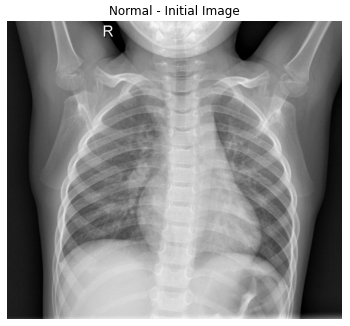
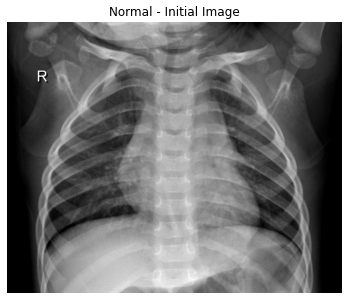
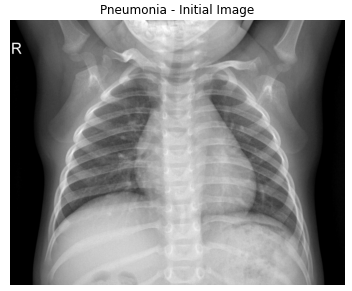
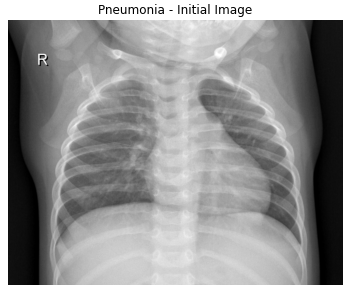
### B) Test Set
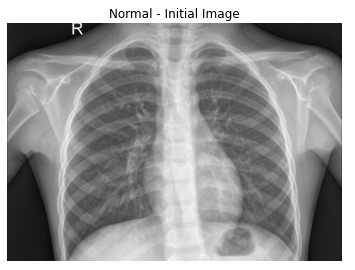
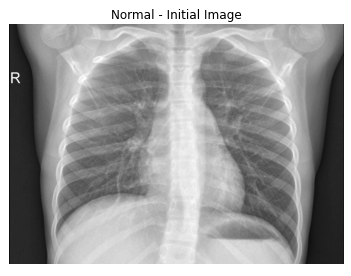
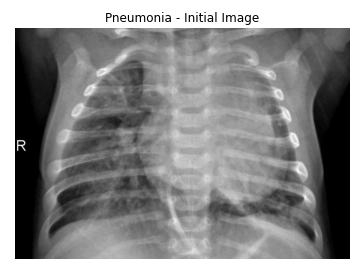
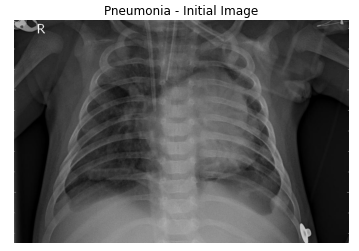

### Function: Shuffling images
At the second step of the pipeline the images are being shuffled in order to avoid images of a certain group (e.g. of the images of the pneumonia phenotype) to be used collectively and in much greater percentage than the images of the other group at any step of the analysis (that accepts random images as input from the datasets) or at the training of the classifier. The classifier selects images as the validation set at specific numbers of iterations, therefore if the images are not shuffled, it could potentially select a great percentage of images from only one group which would lead to decreased validation capability and finaly in decreasing prediction accuracy for both the training and test sets.

In [4]:
def shuffle_images(train_images_paths, train_labels, val_images_paths, val_labels, test_images_paths, test_labels):
    # NumPy arange() is one of the array creation routines based on numerical ranges. It creates an instance of ndarray 
    # with evenly spaced values and returns the reference to it.
    # In this case it creates an array from 0 to minus one of the number of the images in the set.
    train_indexes = np.arange(len(train_images_paths))
    # Then the sequence of the numbers in the array are modified in-place by shuffling its contents.
    np.random.shuffle(train_indexes)
    # Then a new array is created with the elements of the already existing array for the set, ordered based on the shuffled
    # list of numbers (both arrays have the same names).
    train_images_paths = np.array(train_images_paths)[train_indexes]
    # The same applies for the array that contains the labels of the images, thus to retain the one-to-one correspondance of
    # the array with the labels with the array of the images.
    train_labels = np.array(train_labels)[train_indexes]

    val_indexes = np.arange(len(val_images_paths))
    np.random.shuffle(val_indexes)
    val_images_paths = np.array(val_images_paths)[val_indexes]
    val_labels = np.array(val_labels)[val_indexes]

    test_indexes = np.arange(len(test_images_paths))
    np.random.shuffle(test_indexes)
    test_images_paths = np.array(test_images_paths)[test_indexes]
    test_labels = np.array(test_labels)[test_indexes]
    
    return train_images_paths, train_labels, val_images_paths, val_labels, test_images_paths, test_labels

### Function:  Reforming, reshaping and resizing images
The most important preprocessing steps are being performed by the function below. At first the images are loaded based on their paths in Grayscale mode and are resized into 250 x 250 pixels. Secondly, the images are converted into np.arrays which then are normalized by division with 255, subtraction of 0.5 and multiplication of 2. A normalization of division only by 255 was also used but led to smaller precision in the end regarding the identification of pneumonia images. At last, the images are reshaped into one dimensional arrays in order to be used by IPCA.

In addition, it should be noted that after the stage of image normalization and before the final reshaping, there were independent cases where the images were converted by some of the methods of image conversions that were presented above at the section of "Exploratory Data Analysis" (gaussian blur, edge detection, background subtraction) but none of these methods improved the final results, nonetheless some of them resulted in the precision being decreased.

Four images (two for people with pneumonia and two for normal people), for the training and the test sets, are printed on the screen in order for the modifications of the images at each stage to be seen. In the last stage of the preprocessing analysis, as mentioned above, these four images are printed in the form of one dimensional np.arrays.

In [5]:
def transform_images(images_paths):
    WIDTH, HEIGHT = 250, 250
    # The images of the batch are modified exactly as explained above for every image of the batch formed by the previous command.
    images_paths_2 = [Image.open(img_path).resize((HEIGHT, WIDTH)).convert('L') for img_path in images_paths]
    
    # The images of the batch are converted to np.arrays.
    images_paths_3 = [np.array(img) for img in images_paths_2]
    display_image(images_paths_3[0], "Normal - Resized Image (250 x 250)", True, 6, 6)
    display_image(images_paths_3[5], "Normal - Resized Image (250 x 250)", True, 6, 6)
    display_image(images_paths_3[1], "Pneumonia - Resized Image (250 x 250)", True, 6, 6)
    display_image(images_paths_3[2], "Pneumonia - Resized Image (250 x 250)", True, 6, 6)
    
    # The images of the batch are normalized.
    # The elements of the 2D arrays (images) are divided by 255, decreased by 0.5 and multipled by 2. 
    images_paths_4 = (((np.array(images_paths_3) / 255) - 0.5) * 2)
    display_image(images_paths_4[0], "Normal - Normalized Image (250 x 250)", True, 6, 6)
    display_image(images_paths_4[5], "Normal - Normalized Image (250 x 250)", True, 6, 6)
    display_image(images_paths_4[1], "Pneumonia - Normalized Image (250 x 250)", True, 6, 6)
    display_image(images_paths_4[2], "Pneumonia - Normalized Image (250 x 250)", True, 6, 6)

    # The images of the batch are reshaped.
    # The images up until this point are represented by 2D arrays with dimensions of WIDTH x HEIGHT.
    # In this final transformation the arrays are flattened into 1D arrays with dimensions of 1 x (WIDTH*HEIGHT).
    images_paths_5 = images_paths_4.reshape((-1, WIDTH * HEIGHT))
    print("Final array dimensions:")
    print(images_paths_5[0].shape)
    print("Final shape of images for IPCA:")
    print(images_paths_5[0])
    print(images_paths_5[5])
    print(images_paths_5[1])
    print(images_paths_5[2])
    
    return images_paths_5


### Processing Images Steps
Four images (two for people with pneumonia and two for normal people), for the training and the test sets, are printed on the screen in order for the modifications of the images at each stage to be seen. In the last stage of the preprocessing analysis, as mentioned above, these four images are printed in the form of one dimensional arrays.
### A) Training Set Images
### A.1) Resized images into 250 x 250
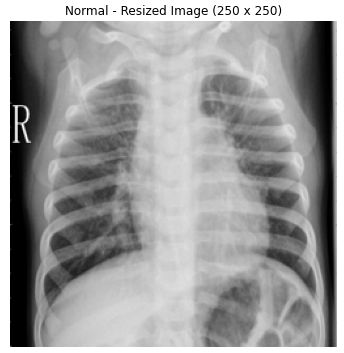
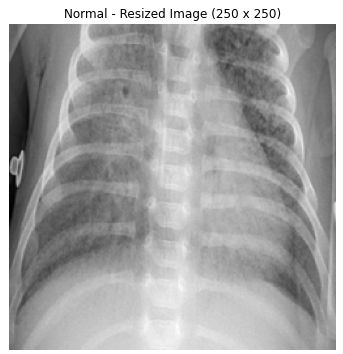
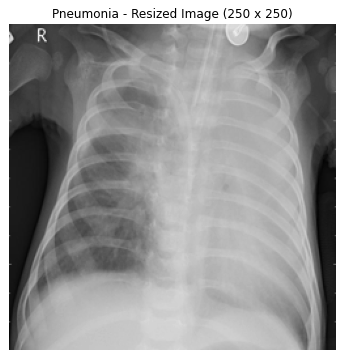
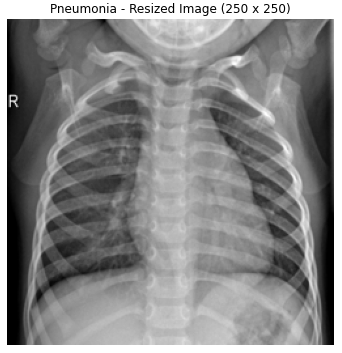
### A.2) Normalized images
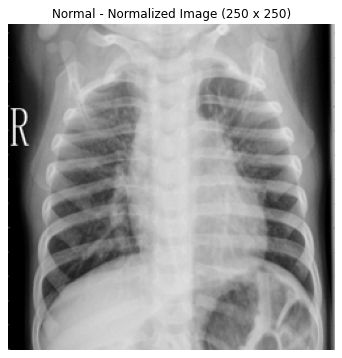
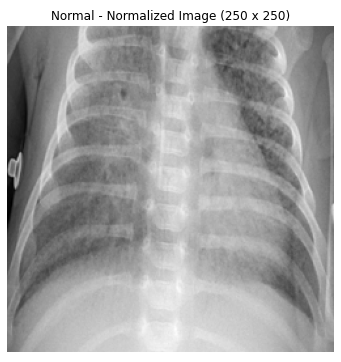
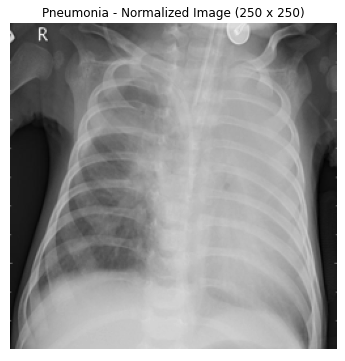
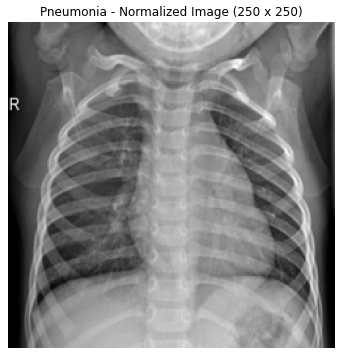
### A.3) Reshaped images
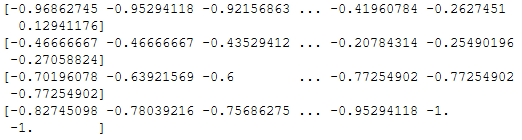
### B) Test Set Images
### B.1) Resized images into 250 x 250
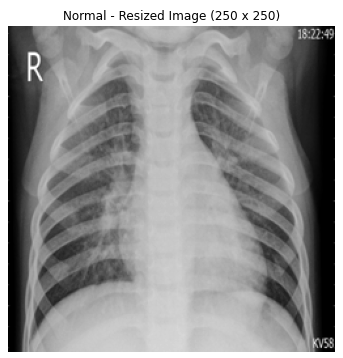
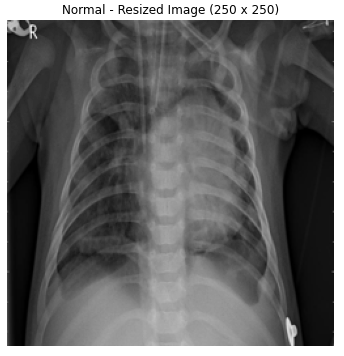
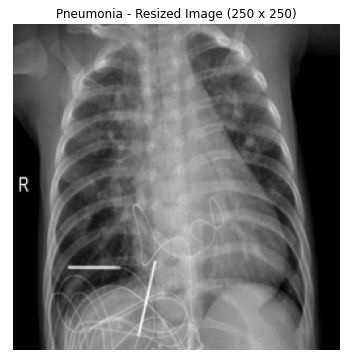
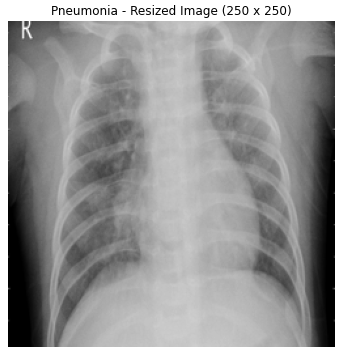
### B.2) Normalized images
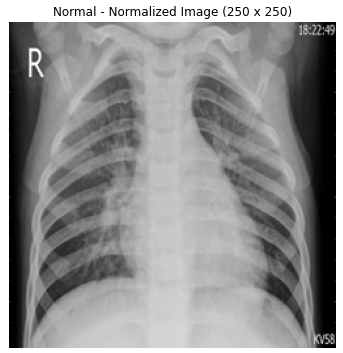
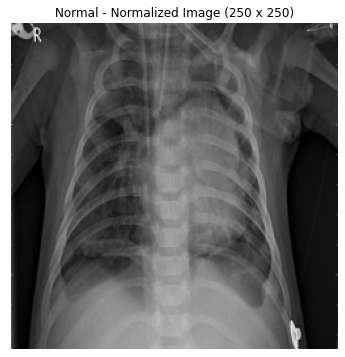
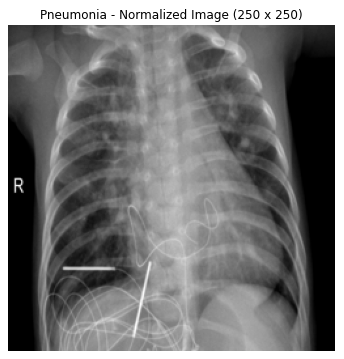
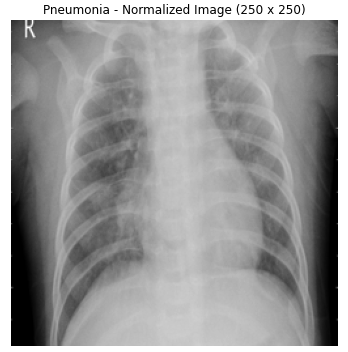
### B.3) Reshaped images
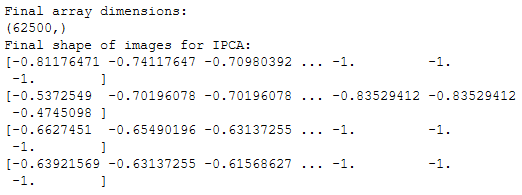

###  Function:  Creation of batches
The function below is used in order to create slices of input arrays, based on which slices later on the fitting of IPCA is done because the use of the whole training dataset at once was not possible due to its size.

In [6]:
def gen_batches(n, batch_size, min_batch_size=0):
    # The isinstance() function returns True if the specified object (batch_size) is of the specified type (numbers.Integral).
    # numbers.Integral: Corresponds to the type of "integer" (e.g. 3.0 or 3+0j would return False).
    # Thus if the number given to the batch_size is not an integer than an Error is raised.
    if not isinstance(batch_size, numbers.Integral):
        raise TypeError("gen_batches got batch_size=%s, must be an"" integer" % batch_size)
    # Also if the number given to the batch_size is negative, an Error is raised.
    if batch_size <= 0:
        raise ValueError("gen_batches got batch_size=%s, must be"" positive" % batch_size)
    
    start = 0
    # Example: 
    # batch_size = 100
    # n = 220 (number of all elements in the set)
    # A loop in the range of the reminder from the floor division of two numbers, in this case of int(220/100) = int(2) = 2.
    # Thus it would be in range of 0 to 2, thus two iterations.
    for _ in range(int(n // batch_size)):
        # Iteration 1: end = 0 + 100 = 100.
        # Iteration 2: end = 100 + 100 = 200.
        end = start + batch_size
        # Iteration 1: 100 + 0 > 220: False
        # Iteration 2: 200 + 0 > 220: False
        # If in an iteration these variables would surpass n then the loop would continue and would actually be terminated as
        # there would be no next iteration.
        if end + min_batch_size > n:
            continue
        # Iteration 1:
        # The slice would be slice(0, 100)
        # Then the slice is stored in the name of the function.
        # Iteration 2:
        # The slice would be slice(100, 200)
        # Then the slice is stored in the name of the function.
        yield slice(start, end)
        # Iteration 1: start = 100
        # iteration 2: start = 200
        start = end
    
    # After all iterations: 200 < 220: True: One more slice, which is (200, 220) is yielded and stored in the name of the function.
    # Therefore, in this example, three slices are yielded: (0, 100), (100, 200) and (200, 220). 
    if start < n:
        yield slice(start, n)

### Function: Fitting IPCA based on a dataset.
Incremental principal components analysis (IPCA) is a linear dimensionality reduction method using Singular Value Decomposition (SVD) of the data, keeping only the most significant singular vectors to project the data to a lower dimensional space. The input data is centered but not scaled for each feature before applying the SVD. Depending on the size of the input data this algorithm can allow sparse input. Also, this algorithm has constant memory complexity (order of batch_size*n_features). For sparse matrices, the input is converted to dense in batches (in order to be able to subtract the mean) which avoids storing the entire dense matrix. It should be noted that loading the whole matrix of the training data at once failed due to insufficient memmory. The same problem arose when trying to perform PCA. So, due to the size of the training dataset IPCA is fitted partialy to each batch of the images used for training. After the fitting of IPCA, it can be implemented to each batch of each of the datasets (training and test sets). Therefore, the extraction of features was based on IPCA. Images at the last stage of their preprocessing had to be converted to 1D arrays so their visulization, at least as conventional 2D images, was not possible after that stage nor of the extracted features from them in a way of being directly correlated to the 2D images of normal people or of people with pneumonia.

Also, different combinations of the final number of components for the dataset of reduced dimensionality were used. Specifically, based on the limitation of the final number of components (in correlation with the size of the batches), the following combinations were implemented:

Batches size - Components number: 206-95, 512-50, 1024-150 and 512-95.

The one combination that was found to be giving the best results (or at least equally good with another combination) and was selected to be used in our pipeline was: 512-95.

In [7]:
def ipca_fit(fit_images_paths, batch_size, components_number):
    ipca = IPCA(n_components=components_number)

    # Only used when calling fit. If batch_size is None, then batch_size is inferred from the data and set to 5 * n_features, 
    # to provide a balance between approximation accuracy and memory consumption.
    total_time = 0
    # _gen_batches: Generator to create slices containing batch_size elements, from 0 to n. The last slice may contain less than 
    # batch_size elements, when batch_size does not divide n. The function returns (by its name) all the slices needed in order
    # to parse all elements of the set.
    for batch in gen_batches(n=len(fit_images_paths), batch_size=batch_size):
        print(batch)
        # A batch of images based on the slice and the images of the train set is created.
        # Example: If the slice is (0, 100) then the batch returned will be from image 0 to image 99.
        X_batch = fit_images_paths[batch]
        # The time is stored in the variable t_start
        t_start = time()
        # IPCA is implemented on the batch of the modified images of the training batch.
        ipca.partial_fit(X_batch)
        # The time duration for the IPCA to be implemented is computed by subtracting the variable t_start from the current time.
        total_time += time() - t_start
    total_time = round(total_time, 2)
    print("Total time spent on IPCA partial fit (sklearn): " + str(total_time))
    return ipca

###  Function: Transforming a dataset

After IPCA was fitted on the training data it was used in order to transform the training data and the test data based on the function below. The function below accepts as input a dataset (np.array which in this case is "tr_images_paths") and it transforms it, in batches, based on a given final number of components and on the fitted IPCA.

In [11]:
def ipca_transform(ipca, components_number, batch_size, tr_images_paths):
    # A np.array is created filled with 0s with the width equal to number of elements in the set and with length equal to the number
    # of the chosen components of the IPCA.
    images_pca = np.zeros((len(tr_images_paths), components_number))

    total_time = 0
    # The same function as above is used in this case in order to collect all slices.
    for batch in gen_batches(n=len(tr_images_paths), batch_size=batch_size):
        print(batch)
        # A batch of images is formed, based on the paths of the images and on the current slice.
        X_batch = tr_images_paths[batch]
        # The time is stored in the variable t_start.
        t0 = time()
        # Now, the images of the batch (in constrast with the loop implemented in the previous code cell)
        # are transformed based on the IPCA that was fitted before.
        images_pca[batch] = ipca.transform(X_batch)
        # The time duration for the IPCA to be implemented is computed by subtracting the variable t_start from the current time.    
        total_time += time() - t0
    total_time = round(total_time, 2)
    print("Time spent on IPCA train transform (sklearn): " + str(total_time))
    return images_pca

## 2.2 Training SVM
---

###  Function: Classifier Training

The "GridSearchCV" is used in order to achieve an exhaustive search over specified parameter values for an estimator. The SVM classifier is based on "C-Support Vector Classification" which is an implementation based on "libsvm". It should be noted that the fit time scales at least quadratically with the number of samples and may be impractical beyond tens of thousands of samples. The multiclass support is handled according to a one-vs-one scheme.

Different combinations of values for the parameters of the "to be trained" classifier were used as well as parameters were added or excluded for different cases, until deciding on the final best combination. More specifically, the "gamma" parameter in the "param_grid", which is the kernel coefficient for the "rbf", "poly" and "sigmoid" types of kernels, was also used with the argument of "scale". Also, all the different type of kernels were implemented, "linear", "poly", "rbf", "sigmoid" and "precomputed". For the "poly" type of kernel different values for the degree of the polynomial kernel function were used. In addition, the parameter "class_weight" was tested as "balaned" and "none". Finally, the "n_splits_" which determines the number of cross-validation splits was tested for different values. It should be noted that validation sets are being created automatically while the classifier is being trained from the training images and that is why the initial validation set was merged with the training set.

Based on all the different combinations of parameters and of their values, the model gave a maximum of precision for both classes in a specific case which includes the parameters and their values as used below (some of the other cases and the precisions for both classes can also be seen in the comments below).


In [12]:
def classifier(training_set, training_labels):
    # Fitting the classifiers.
    param_grid = {
        'C': [1e0, 5e0,1e1,5e1,1e2,5e2,1e3,5e3,1e4,5e4],
        'gamma': ['auto','auto','auto','auto','auto','auto','auto'], 
    }

    # scale and poly -> 1 and 1 & 0.97 and o.73
    # auto and poly -> 1 and 1 & 0.95 and 0.74 <---
    # scale and rbf -> 1 and 1 & 0.95 and 0.73
    # auto and rbf -> 1 and 1 & 0 and 0.62
    clf = GridSearchCV(SVC(kernel='poly'), param_grid, verbose=3)
    clf = clf.fit(training_set, training_labels)

    print("Best estimator found by grid search:")
    print(clf.best_estimator_)
    return clf

###  Function: Test Images

This is a function created to use the trained classifier in order to make predictions upon a given set of images and compare the predictions with a given set of labels. It also generates the "classification_report" and the "confusion_matrix".

In [32]:
def test_images(clf, test_images, test_labels):
    train_pred = clf.predict(test_images)
    print(classification_report(test_labels, train_pred))
    print(confusion_matrix(test_labels, train_pred))
    return train_pred

The pipeline starts to be implemented from the cell below. It calls for the initial functions which collect the images, shuffle them, merge the training and validation sets and their corresponding labels and also transform the images during their preprocessing.

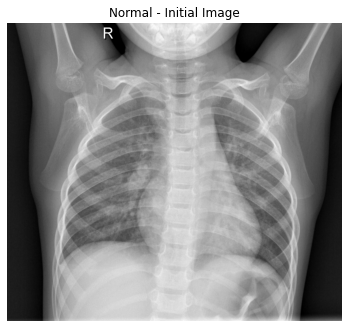

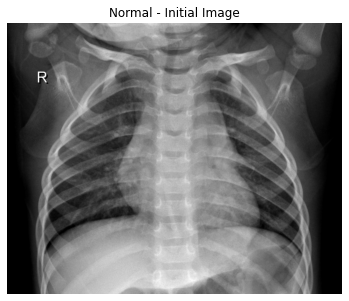

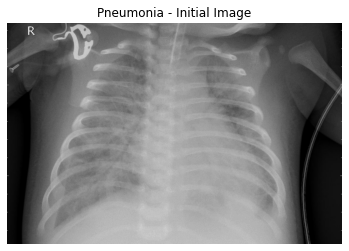

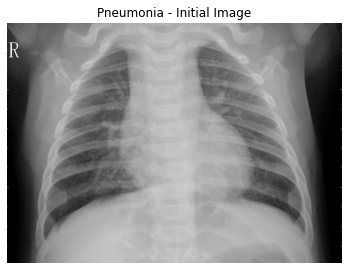

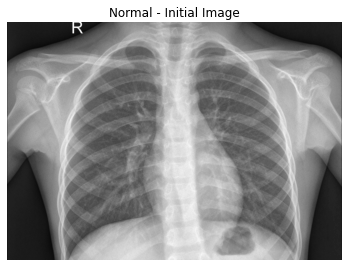

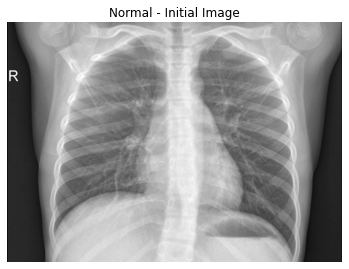

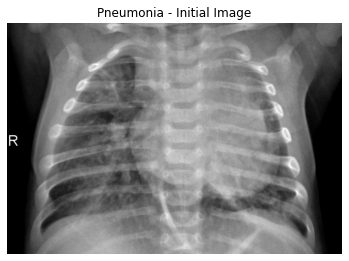

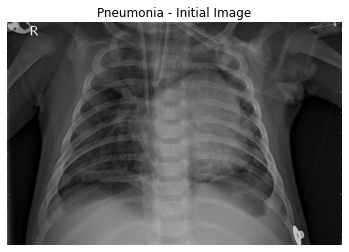

The number of the images in the training set are 5216 and the number of the images in the validation set are 16.
The number of the images in the new training set are 5232.


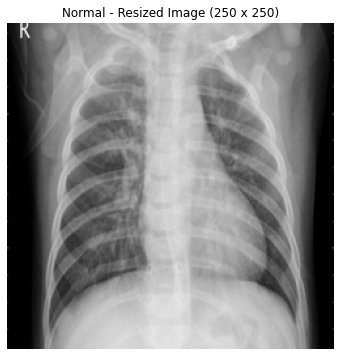

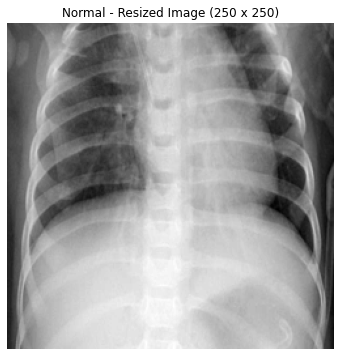

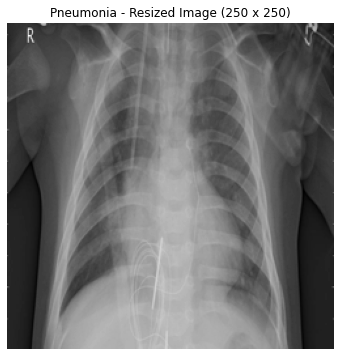

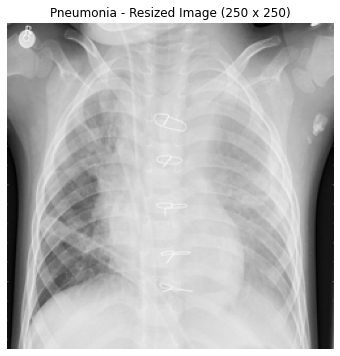

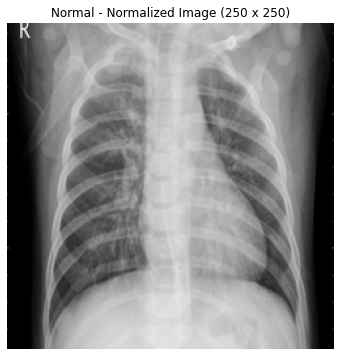

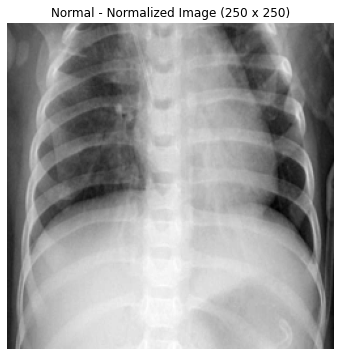

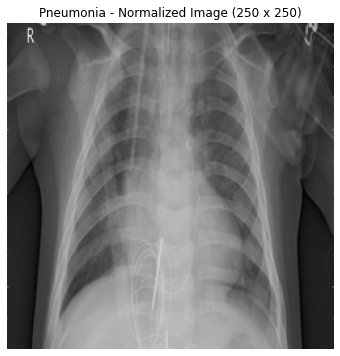

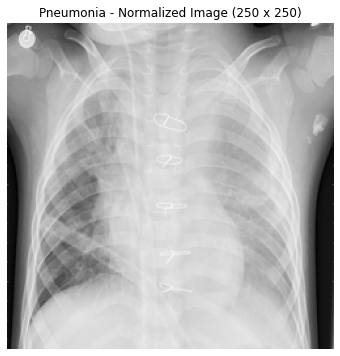

Final array dimensions:
(62500,)
Final shape of images for IPCA:
[-0.96862745 -0.9372549  -0.89803922 ... -1.         -1.
 -1.        ]
[-0.37254902 -0.35686275 -0.34117647 ... -0.4745098  -0.51372549
 -0.55294118]
[-0.67843137 -0.6627451  -0.64705882 ... -0.7254902  -0.7254902
 -0.7254902 ]
[-0.02745098 -0.12941176 -0.20784314 ... -0.70196078 -0.52941176
 -0.11372549]


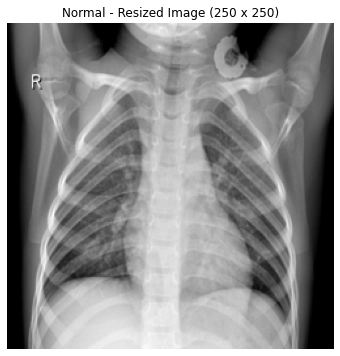

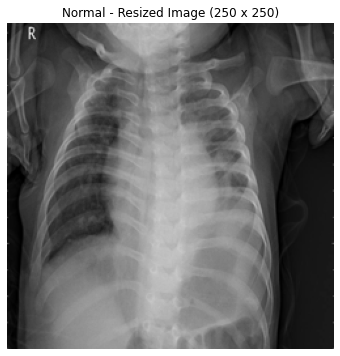

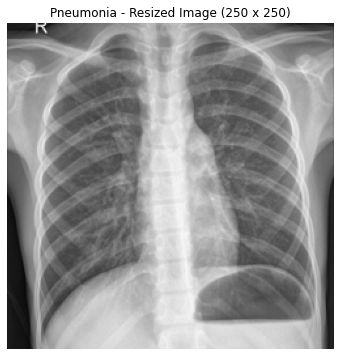

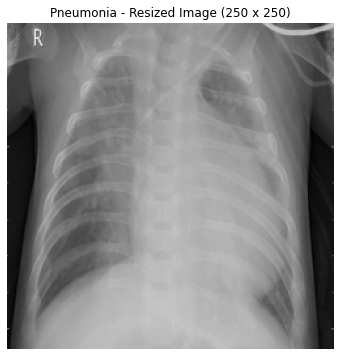

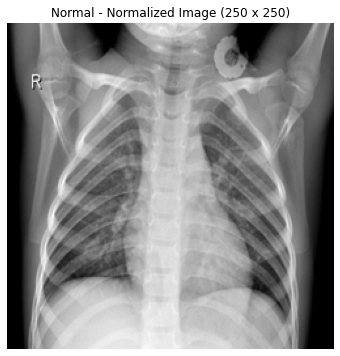

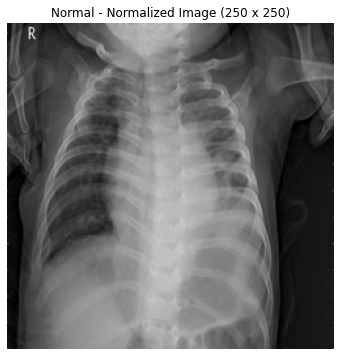

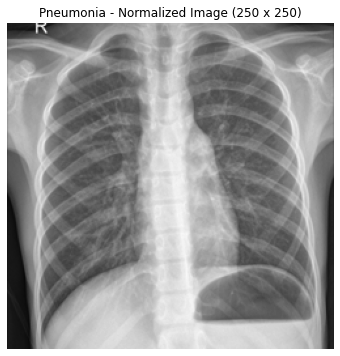

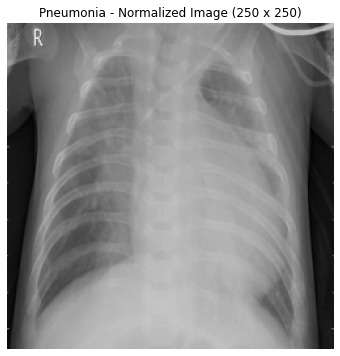

Final array dimensions:
(62500,)
Final shape of images for IPCA:
[-0.98431373 -0.9372549  -0.82745098 ... -1.         -1.
 -1.        ]
[-0.76470588 -0.81960784 -0.89019608 ... -0.81960784 -0.82745098
 -0.50588235]
[-0.76470588 -0.74117647 -0.74117647 ... -0.73333333 -0.70196078
 -0.7254902 ]
[ 0.00392157 -0.2        -0.27843137 ... -0.78823529 -0.79607843
 -0.81960784]


In [16]:
# Datasets collection
train_images_paths, train_labels, val_images_paths, val_labels, test_images_paths, test_labels = collect_images()
# Datasets shuffling
train_images_paths, train_labels, val_images_paths, val_labels, test_images_paths, test_labels = shuffle_images(train_images_paths, train_labels, val_images_paths, val_labels, test_images_paths, test_labels)

# Merging the given training and validation sets into one training set.
print("The number of the images in the training set are " + str(len(train_images_paths)) + " and the number of the images in the validation set are " + str(len(val_images_paths)) + ".")
train_images_paths = np.hstack((train_images_paths, val_images_paths))
train_labels = np.hstack((train_labels, val_labels))
print("The number of the images in the new training set are " + str(len(train_images_paths)) + ".")

# Datasets transformation
train_images_paths_tr = transform_images(train_images_paths)
test_images_paths_tr = transform_images(test_images_paths)

Then, the functions called below are the ones used to fit IPCA on the training data and then use the fitted IPCA in order to transform the training and test data.

In [17]:
batch_size = 512
components_number = 95
ipca = ipca_fit(train_images_paths_tr, batch_size, components_number)
train_images_ipca = ipca_transform(ipca, components_number, batch_size, train_images_paths_tr)
test_images_ipca = ipca_transform(ipca, components_number, batch_size, test_images_paths_tr)

slice(0, 512, None)
slice(512, 1024, None)
slice(1024, 1536, None)
slice(1536, 2048, None)
slice(2048, 2560, None)
slice(2560, 3072, None)
slice(3072, 3584, None)
slice(3584, 4096, None)
slice(4096, 4608, None)
slice(4608, 5120, None)
slice(5120, 5232, None)
Total time spent on IPCA partial fit (sklearn): 135.97
slice(0, 512, None)
slice(512, 1024, None)
slice(1024, 1536, None)
slice(1536, 2048, None)
slice(2048, 2560, None)
slice(2560, 3072, None)
slice(3072, 3584, None)
slice(3584, 4096, None)
slice(4096, 4608, None)
slice(4608, 5120, None)
slice(5120, 5232, None)
Time spent on IPCA train transform (sklearn): 6.75
slice(0, 512, None)
slice(512, 624, None)
Time spent on IPCA train transform (sklearn): 1.74


The function below creates the classifier based on the given training images and their labels.

In [18]:
clf = classifier(train_images_ipca, train_labels)

Fitting 5 folds for each of 70 candidates, totalling 350 fits
[CV 1/5] END .................C=1.0, gamma=auto;, score=0.962 total time=   0.6s
[CV 2/5] END .................C=1.0, gamma=auto;, score=0.955 total time=   0.5s
[CV 3/5] END .................C=1.0, gamma=auto;, score=0.961 total time=   0.6s
[CV 4/5] END .................C=1.0, gamma=auto;, score=0.958 total time=   0.5s
[CV 5/5] END .................C=1.0, gamma=auto;, score=0.963 total time=   0.7s
[CV 1/5] END .................C=1.0, gamma=auto;, score=0.962 total time=   0.9s
[CV 2/5] END .................C=1.0, gamma=auto;, score=0.955 total time=   0.6s
[CV 3/5] END .................C=1.0, gamma=auto;, score=0.961 total time=   0.6s
[CV 4/5] END .................C=1.0, gamma=auto;, score=0.958 total time=   0.7s
[CV 5/5] END .................C=1.0, gamma=auto;, score=0.963 total time=   0.8s
[CV 1/5] END .................C=1.0, gamma=auto;, score=0.962 total time=   0.8s
[CV 2/5] END .................C=1.0, gamma=auto

[CV 2/5] END ................C=10.0, gamma=auto;, score=0.955 total time=   0.4s
[CV 3/5] END ................C=10.0, gamma=auto;, score=0.961 total time=   0.4s
[CV 4/5] END ................C=10.0, gamma=auto;, score=0.958 total time=   0.5s
[CV 5/5] END ................C=10.0, gamma=auto;, score=0.963 total time=   0.5s
[CV 1/5] END ................C=50.0, gamma=auto;, score=0.962 total time=   0.5s
[CV 2/5] END ................C=50.0, gamma=auto;, score=0.955 total time=   0.4s
[CV 3/5] END ................C=50.0, gamma=auto;, score=0.961 total time=   0.4s
[CV 4/5] END ................C=50.0, gamma=auto;, score=0.958 total time=   0.5s
[CV 5/5] END ................C=50.0, gamma=auto;, score=0.963 total time=   0.5s
[CV 1/5] END ................C=50.0, gamma=auto;, score=0.962 total time=   0.5s
[CV 2/5] END ................C=50.0, gamma=auto;, score=0.955 total time=   0.4s
[CV 3/5] END ................C=50.0, gamma=auto;, score=0.961 total time=   0.5s
[CV 4/5] END ...............

[CV 4/5] END ...............C=500.0, gamma=auto;, score=0.958 total time=   0.5s
[CV 5/5] END ...............C=500.0, gamma=auto;, score=0.963 total time=   0.7s
[CV 1/5] END ...............C=500.0, gamma=auto;, score=0.962 total time=   0.5s
[CV 2/5] END ...............C=500.0, gamma=auto;, score=0.955 total time=   0.4s
[CV 3/5] END ...............C=500.0, gamma=auto;, score=0.961 total time=   0.4s
[CV 4/5] END ...............C=500.0, gamma=auto;, score=0.958 total time=   0.5s
[CV 5/5] END ...............C=500.0, gamma=auto;, score=0.963 total time=   0.7s
[CV 1/5] END ..............C=1000.0, gamma=auto;, score=0.962 total time=   0.7s
[CV 2/5] END ..............C=1000.0, gamma=auto;, score=0.955 total time=   0.7s
[CV 3/5] END ..............C=1000.0, gamma=auto;, score=0.961 total time=   1.1s
[CV 4/5] END ..............C=1000.0, gamma=auto;, score=0.958 total time=   0.9s
[CV 5/5] END ..............C=1000.0, gamma=auto;, score=0.963 total time=   0.8s
[CV 1/5] END ..............C

[CV 1/5] END .............C=10000.0, gamma=auto;, score=0.962 total time=   1.1s
[CV 2/5] END .............C=10000.0, gamma=auto;, score=0.955 total time=   1.3s
[CV 3/5] END .............C=10000.0, gamma=auto;, score=0.961 total time=   0.7s
[CV 4/5] END .............C=10000.0, gamma=auto;, score=0.958 total time=   0.6s
[CV 5/5] END .............C=10000.0, gamma=auto;, score=0.963 total time=   0.5s
[CV 1/5] END .............C=10000.0, gamma=auto;, score=0.962 total time=   0.5s
[CV 2/5] END .............C=10000.0, gamma=auto;, score=0.955 total time=   0.3s
[CV 3/5] END .............C=10000.0, gamma=auto;, score=0.961 total time=   0.3s
[CV 4/5] END .............C=10000.0, gamma=auto;, score=0.958 total time=   0.4s
[CV 5/5] END .............C=10000.0, gamma=auto;, score=0.963 total time=   0.3s
[CV 1/5] END .............C=50000.0, gamma=auto;, score=0.962 total time=   0.4s
[CV 2/5] END .............C=50000.0, gamma=auto;, score=0.955 total time=   0.4s
[CV 3/5] END .............C=

## 2.3 Test Results
---

The functions below are used in order to implement the trained classifier and make predictions for the training and test data. Also, the results of the "confusion matrix" are stored in variables.

In [38]:
train_pred = test_images(clf, train_images_ipca, train_labels)
results_matrix_train = confusion_matrix(train_labels, train_pred)
train_pred = test_images(clf, test_images_ipca, test_labels)
results_matrix_test = confusion_matrix(test_labels, train_pred)

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1349
         1.0       1.00      1.00      1.00      3883

    accuracy                           1.00      5232
   macro avg       1.00      1.00      1.00      5232
weighted avg       1.00      1.00      1.00      5232

[[1349    0]
 [   0 3883]]
              precision    recall  f1-score   support

         0.0       0.95      0.41      0.57       234
         1.0       0.73      0.99      0.84       390

    accuracy                           0.77       624
   macro avg       0.84      0.70      0.71       624
weighted avg       0.82      0.77      0.74       624

[[ 95 139]
 [  5 385]]


Finally, based on the results of the "confusion matrix" above, the heatmaps below are generated.

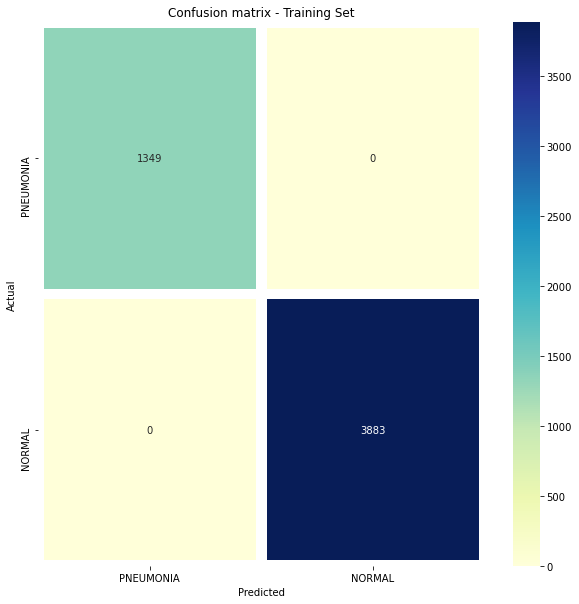

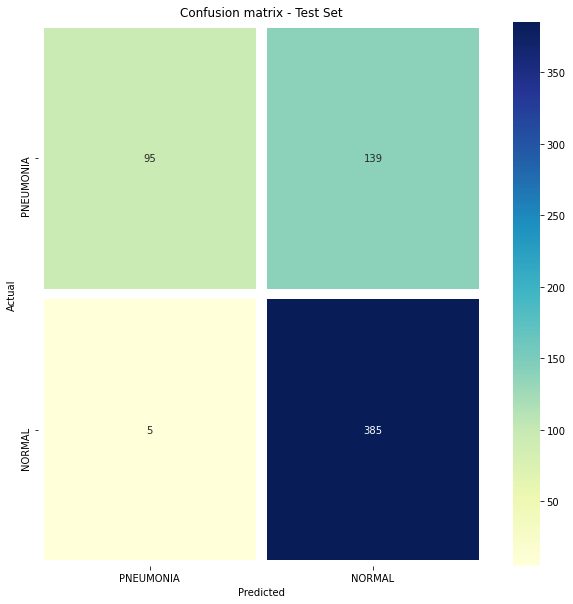

In [39]:
plt.figure(figsize = (10,10))
plt.title('Confusion matrix - Training Set')
sns.heatmap(results_matrix_train ,cmap="YlGnBu", linecolor = 'white' , linewidth = 10 , annot = True, fmt='',xticklabels = labels, yticklabels = labels)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

plt.figure(figsize = (10,10))
plt.title('Confusion matrix - Test Set')
sns.heatmap(results_matrix_test ,cmap="YlGnBu", linecolor = 'white' , linewidth = 10 , annot = True, fmt='',xticklabels = labels, yticklabels = labels)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# 3. Neural Network Approach (CNN)


---




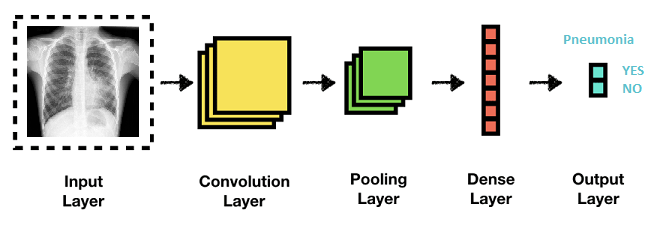

CNNs are deep neural networks for which the primarily used input is images. CNNs learn the filters (features) that are hand-engineered in traditional algorithms. This independence from prior knowledge and human effort in feature design is a major advantage. They also reduce the number of parameters to be learned with their shared-weights architecture and possess translation invariance characteristics.

## 3.1 Data Preprocessing
---

### Normalization

In [18]:
x_train = np.array(x_train) / 255
x_val = np.array(x_val) / 255
x_test = np.array(x_test) / 255

### Resize data for NN input

In [19]:
x_train = x_train.reshape(-1, img_size, img_size, 1)
y_train = np.array(y_train)

x_val = x_val.reshape(-1, img_size, img_size, 1)
y_val = np.array(y_val)

x_test = x_test.reshape(-1, img_size, img_size, 1)
y_test = np.array(y_test)

### Data Augmentation

In order to avoid over-fitting problem, we need to expand artificially our dataset. Data augmentation is a strategy that enables to significantly increase the diversity of data available for our training model. Since during the data exploration stage we detected an imbalance in the trainning data, it is more than useful to expand the dataset via augmentation.

In [20]:
datagen = ImageDataGenerator(
        featurewise_center=False,             # set input mean to 0 over the dataset
        samplewise_center=False,              # set each sample mean to 0
        featurewise_std_normalization=False,  # divide inputs by std of the dataset
        samplewise_std_normalization=False,   # divide each input by its std
        zca_whitening=False,    # apply ZCA whitening
        rotation_range = 30,    # random rotation in the range 0 to 180 degrees
        zoom_range = 0.2,       # random zoom  
        width_shift_range=0.1,  # random horizontal shift  (fraction of total width)
        height_shift_range=0.1,  # random vertical shift   (fraction of total height)
        horizontal_flip = True,  # random horizontal flip 
        vertical_flip=False)  # random vertical flip 

datagen.fit(x_train)

For this step, we choosed to :

- Randomly rotate some training images by 30 degrees
- Randomly Zoom by 20% some training images
- Randomly shift images horizontally by 10% of the width
- Randomly shift images vertically by 10% of the height
- Randomly flip images horizontally (as chest x-ray images don't have any significant meaning when horizontally flipped(at least for machine learning purpose)

Once our model is ready, we fit the training dataset.

## Model

In [21]:
model = Sequential()
model.add(Conv2D(32 , (3,3) , strides = 1 , padding = 'same' , activation = 'relu' , input_shape = (150,150,1)))
model.add(BatchNormalization())
model.add(MaxPool2D((2,2) , strides = 2 , padding = 'same'))
model.add(Conv2D(64 , (3,3) , strides = 1 , padding = 'same' , activation = 'relu'))
model.add(Dropout(0.1))
model.add(BatchNormalization())
model.add(MaxPool2D((2,2) , strides = 2 , padding = 'same'))
model.add(Conv2D(64 , (3,3) , strides = 1 , padding = 'same' , activation = 'relu'))
model.add(BatchNormalization())
model.add(MaxPool2D((2,2) , strides = 2 , padding = 'same'))
model.add(Conv2D(128 , (3,3) , strides = 1 , padding = 'same' , activation = 'relu'))
model.add(Dropout(0.2))
model.add(BatchNormalization())
model.add(MaxPool2D((2,2) , strides = 2 , padding = 'same'))
model.add(Conv2D(256 , (3,3) , strides = 1 , padding = 'same' , activation = 'relu'))
model.add(Dropout(0.2))
model.add(BatchNormalization())
model.add(MaxPool2D((2,2) , strides = 2 , padding = 'same'))
model.add(Flatten())
model.add(Dense(units = 128 , activation = 'relu'))
model.add(Dropout(0.2))
model.add(Dense(units = 1 , activation = 'sigmoid'))
model.compile(optimizer = "rmsprop" , loss = 'binary_crossentropy' , metrics = ['accuracy'])
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 150, 150, 32)      320       
_________________________________________________________________
batch_normalization (BatchNo (None, 150, 150, 32)      128       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 75, 75, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 75, 75, 64)        18496     
_________________________________________________________________
dropout (Dropout)            (None, 75, 75, 64)        0         
_________________________________________________________________
batch_normalization_1 (Batch (None, 75, 75, 64)        256       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 38, 38, 64)        0

## 3.2 Training
---

During training we apply a technique called **Learning Rate Reduction**.
The learning rate is a hyperparameter that controls how much to change the model in response to the estimated error each time the model weights are updated. Choosing the learning rate is challenging as a value too small may result in a long training process that could get stuck, whereas a value too large may result in learning a sub-optimal set of weights too fast or an unstable training process.

**Small Learning Rate**

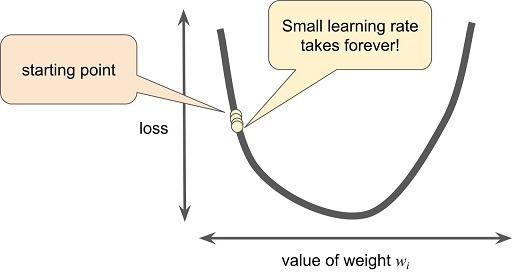

**Large Learning Rate**

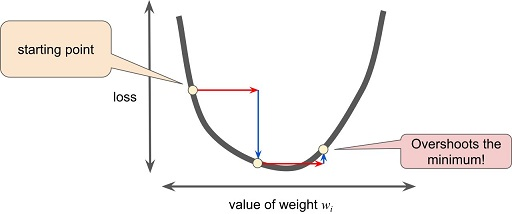

**Right Learning Rate**

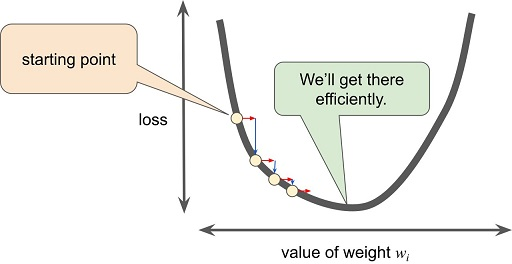

In [22]:
learning_rate_reduction = ReduceLROnPlateau(monitor='val_accuracy', patience = 2, verbose=1,factor=0.3, min_lr=0.000001)

We're training our model for 12 epochs. This means we're giving the model 12 chances to learn patterns about our data. Using more epochs, the model was overfitting and testing accuracy was decreasing. Cross validation can verify this.

In [23]:
history = model.fit(datagen.flow(x_train,y_train, batch_size = 32) ,epochs = 12 , validation_data = datagen.flow(x_val, y_val) ,callbacks = [learning_rate_reduction])

Epoch 1/12
163/163 [==============================] - 405s 2s/step - loss: 0.6938 - accuracy: 0.8384 - val_loss: 17.1646 - val_accuracy: 0.5000
Epoch 2/12
163/163 [==============================] - 400s 2s/step - loss: 0.2797 - accuracy: 0.8940 - val_loss: 42.2398 - val_accuracy: 0.5000
Epoch 3/12
163/163 [==============================] - ETA: 0s - loss: 0.2179 - accuracy: 0.9174
Epoch 00003: ReduceLROnPlateau reducing learning rate to 0.0003000000142492354.
163/163 [==============================] - 435s 3s/step - loss: 0.2179 - accuracy: 0.9174 - val_loss: 53.7976 - val_accuracy: 0.5000
Epoch 4/12
163/163 [==============================] - 383s 2s/step - loss: 0.1578 - accuracy: 0.9471 - val_loss: 9.4303 - val_accuracy: 0.5000
Epoch 5/12
163/163 [==============================] - 378s 2s/step - loss: 0.1448 - accuracy: 0.9473 - val_loss: 2.5115 - val_accuracy: 0.5625
Epoch 6/12
163/163 [==============================] - 371s 2s/step - loss: 0.1312 - accuracy: 0.9536 - val_loss: 0.61

## 3.3 Predictions - Evaluation
---

In [22]:
print("Test loss - " , model.evaluate(x_test,y_test)[0])
print("Test Accuracy - " , model.evaluate(x_test,y_test)[1]*100 , "%")

20/20 [==============================] - 3s 104ms/step - loss: 0.3145 - accuracy: 0.9215
Test loss -  0.3145267963409424
20/20 [==============================] - 2s 105ms/step - loss: 0.3145 - accuracy: 0.9215
Test Accuracy -  92.14743375778198 %


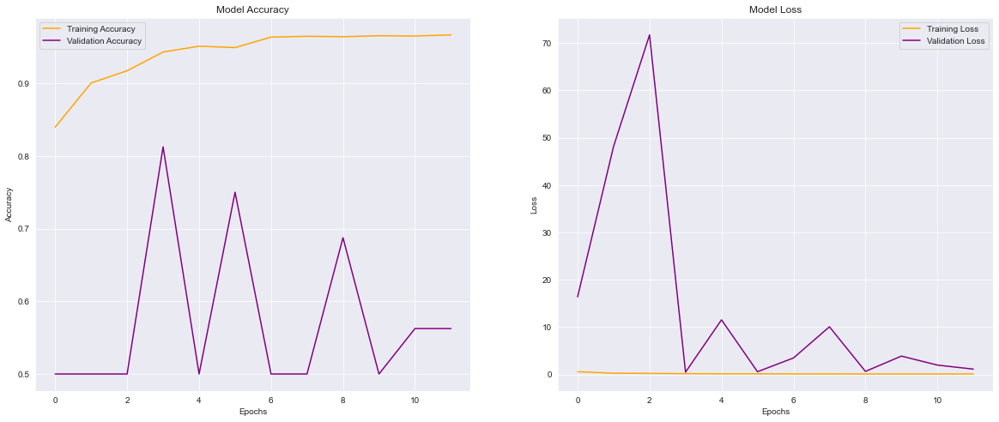

In [23]:
epochs = [i for i in range(12)]
fig , ax = plt.subplots(1,2)
train_acc = history.history['accuracy']
train_loss = history.history['loss']
val_acc = history.history['val_accuracy']
val_loss = history.history['val_loss']
fig.set_size_inches(20,8)

ax[0].plot(epochs , train_acc , 'orange' , label = 'Training Accuracy')
ax[0].plot(epochs , val_acc , 'purple' , label = 'Validation Accuracy')
ax[0].set_title('Model Accuracy')
ax[0].set_xlabel("Epochs")
ax[0].set_ylabel("Accuracy")
ax[0].legend()

ax[1].plot(epochs , train_loss , 'orange' , label = 'Training Loss')
ax[1].plot(epochs , val_loss , 'purple' , label = 'Validation Loss')
ax[1].set_title('Model Loss')
ax[1].set_xlabel("Epochs")
ax[1].set_ylabel("Loss")
ax[1].legend()

plt.show()

In [24]:
predictions = model.predict_classes(x_test)
predictions = predictions.reshape(1, -1)[0]

my_report = classification_report(y_test, predictions, target_names = ['Pneumonia','Normal'])
print(my_report)

              precision    recall  f1-score   support

   Pneumonia       0.92      0.95      0.94       390
      Normal       0.92      0.87      0.89       234

    accuracy                           0.92       624
   macro avg       0.92      0.91      0.92       624
weighted avg       0.92      0.92      0.92       624



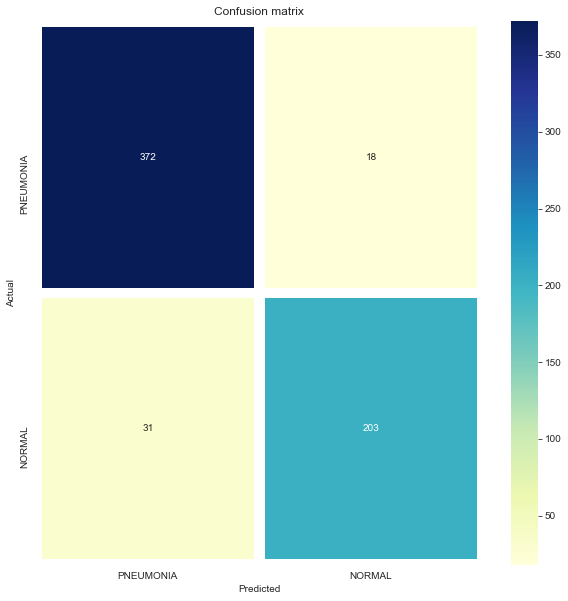

In [25]:
cm = pd.DataFrame(confusion_matrix(y_test,predictions) , index = ['0','1'] , columns = ['0','1'])

plt.figure(figsize = (10,10))
plt.title('Confusion matrix')
sns.heatmap(cm,cmap="YlGnBu", linecolor = 'white' , linewidth = 10 , annot = True, fmt='',xticklabels = labels,yticklabels = labels)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

## 4. Conclusions
---
Overall, the precision of detecting normal people was very high for both models (higher for the SVM with 95% in comparison with the neural network which achieved 92%) and the precision of detecting people with pneumonia was equally high for the neural network but relatively high for the SVM (73%-74%). The SVM method showed a drawback regarding the identification of people who had pneumonia but where predicted as normal, a percentage which was much lower for the neural network. In general in all categories (precision and specificity, as shown in the heatmaps) the neural network showed a better perfomance overall.

Also, based on the preprocessing of the data and the results of both models we conclude that, although machine learning methods like SVM didn’t provide us with a good model performance compared to a deep learning algorithm like CNN, it is an ideal candidate to consider before going to these computationally expensive deep learning architectures. 

An advantage of neural networks over the traditional machine learning methods in terms of image classification is that there is no need to extract features. Raw images can be fed into the network and achieve a far greater accuracy. Adding model capacity, searching for the optimal hyper-parameters and adding data augmentation resulted in better performance on the test dataset.

For future work, in order to handle better the imbalance of the training data, it is worth considering the Keras' built-in class_weights parameter to give more weight to the lesser data which, in this case, is the normal chest-x rays in our train set. Additionally, perhaps there could be a boost in performance and accuracy during the preprocessing  stage before feeding the data images in both the neural network and the traditional machine learning method by utilizing some more complex image filtering techniques.